# Library & Path

In [83]:
import pickle 
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
import os 
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages

sheet_csv = r"data/df_merged.csv"
sheet_txt = r"data/df_merged.txt"
pkl_path = r"data/df_merged.pkl"
new_pkl_path = r"data/new_df_merged.pkl"
sheet_csv_clean = r"data/df_merged_clean.csv"

In [84]:
df = pd.read_pickle(pkl_path)
df_final = pd.DataFrame()
for item in df:
    df_final= pd.concat([df_final, item], ignore_index = True)
df_final.to_csv(sheet_csv)

In [85]:

features = [x for x in df[0].columns.values]
feature_remove_target = features
feature_remove_target.remove('Gia KL')
print(feature_remove_target)

['mua_gia_1ACB', 'mua_gia_1BCM', 'mua_gia_1BID', 'mua_gia_1BVH', 'mua_gia_1CTG', 'mua_gia_1FPT', 'mua_gia_1GAS', 'mua_gia_1GVR', 'mua_gia_1HDB', 'mua_gia_1HPG', 'mua_gia_1MBB', 'mua_gia_1MSN', 'mua_gia_1MWG', 'mua_gia_1NVL', 'mua_gia_1PDR', 'mua_gia_1PLX', 'mua_gia_1POW', 'mua_gia_1SAB', 'mua_gia_1SSI', 'mua_gia_1STB', 'mua_gia_1TCB', 'mua_gia_1TPB', 'mua_gia_1VCB', 'mua_gia_1VHM', 'mua_gia_1VIB', 'mua_gia_1VIC', 'mua_gia_1VJC', 'mua_gia_1VNM', 'mua_gia_1VPB', 'mua_gia_1VRE', 'ban_gia_1ACB', 'ban_gia_1BCM', 'ban_gia_1BID', 'ban_gia_1BVH', 'ban_gia_1CTG', 'ban_gia_1FPT', 'ban_gia_1GAS', 'ban_gia_1GVR', 'ban_gia_1HDB', 'ban_gia_1HPG', 'ban_gia_1MBB', 'ban_gia_1MSN', 'ban_gia_1MWG', 'ban_gia_1NVL', 'ban_gia_1PDR', 'ban_gia_1PLX', 'ban_gia_1POW', 'ban_gia_1SAB', 'ban_gia_1SSI', 'ban_gia_1STB', 'ban_gia_1TCB', 'ban_gia_1TPB', 'ban_gia_1VCB', 'ban_gia_1VHM', 'ban_gia_1VIB', 'ban_gia_1VIC', 'ban_gia_1VJC', 'ban_gia_1VNM', 'ban_gia_1VPB', 'ban_gia_1VRE', 'mua_kl_1ACB', 'mua_kl_1BCM', 'mua_kl_1

In [86]:
company_list = []
action_features_list = ["mua_gia_1", "ban_gia_1", "mua_kl_1", "ban_kl_1", "mua_kl_2", "ban_kl_2"]
for item in feature_remove_target:
    new_item = None
    for item_delete in action_features_list:
        if (item_delete in item) == True:
            new_item = item.replace(item_delete,'')
            break
    if (new_item in company_list) == False:
        company_list.append(new_item)
print(company_list)

['ACB', 'BCM', 'BID', 'BVH', 'CTG', 'FPT', 'GAS', 'GVR', 'HDB', 'HPG', 'MBB', 'MSN', 'MWG', 'NVL', 'PDR', 'PLX', 'POW', 'SAB', 'SSI', 'STB', 'TCB', 'TPB', 'VCB', 'VHM', 'VIB', 'VIC', 'VJC', 'VNM', 'VPB', 'VRE']


# Preprocessing
* Trong bô dữ liệu giá cổ phiếu, dữ liệu có đặc tính time series, với mức độ tương quan (corelation) giữa các features được nhóm dự báo là thấp.
* Dữ liệu time series có hệ số tự tương quan rất cao, do đó thích hợp sử dụng các mô hình như Moving Average, Holt Winter, ... Cho kĩ thuật data imputation, và processing missing data
* Để lựa chọn phương pháp fill missing bằng predict model phù hợp: vd các phương pháp Time Series như Exponential Smoothing, MA, Holt Winter hay ARIMA; Hoặc các phương pháp cho Panel data như mô hình regression và unsupervise learning, mice ...
Tiến hành phân tích tự tương quan Time Series và phân tích Correlation matrix giữa các features


## `1.` Autocorrelation

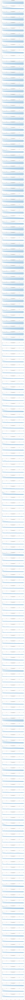

In [87]:
# do khối lượng data lớn, kiểm tra một dataframe trong mẫu
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
def autoCorrelation(df):
    df_item = df[0]
    fig, ax = plt.subplots(df_item.shape[1], figsize=(12,150))
    for item in range(df_item.shape[1]):
        ax[item] = plot_acf(df_item.iloc[:, item].dropna(), ax=ax[item], lags=50)
    fig.show()

with PdfPages('figures/autocorrelation/autocorelation.pdf') as pdf:
    df_item = df[0]
    fig, ax = plt.subplots(df_item.shape[1], figsize=(12,500))
    for item in range(df_item.shape[1]):
        ax[item] = plot_acf(df_item.iloc[:, item].dropna(), ax=ax[item], lags=50)
    pdf.savefig()

Do các biểu đồ tự tương quan có hệ số tương quan tốt với các thời đoạn quá khứ: hơn 99% có ý nghĩa thống kế trong 10 thời đoạn ta có thể sử dụng n =10 là range sử dụng trong mô hình predict để fill missing data

## `2.` Correlation matrix

In [88]:
df = pd.read_pickle(new_pkl_path)
# tính ma trận tương quan của df[0]
df_feature = df[0].drop(columns='Gia KL').dropna()

corr_matrix = df_feature.corr()
print(corr_matrix)
print('Tổng các cặp features là:', 180*180)

# Ngưỡng độ tương quan thấp
threshold = 0.3

# Đếm số cặp feature có độ tương quan thấp
low_correlation_count = np.sum(np.abs(corr_matrix) < threshold).sum()

print("Số cặp feature có độ tương quan thấp:", low_correlation_count)
print("Tỷ lệ các cặp feature có độ tương quan thấp:", low_correlation_count/(180*180))

              mua_gia_1ACB  mua_gia_1BCM  mua_gia_1BID  mua_gia_1BVH  \
mua_gia_1ACB      1.000000     -0.166217      0.598124      0.895076   
mua_gia_1BCM     -0.166217      1.000000      0.013810     -0.184677   
mua_gia_1BID      0.598124      0.013810      1.000000      0.393639   
mua_gia_1BVH      0.895076     -0.184677      0.393639      1.000000   
mua_gia_1CTG      0.850777     -0.098879      0.500569      0.896478   
...                    ...           ...           ...           ...   
ban_kl_2VIC      -0.509557      0.014004     -0.445006     -0.398428   
ban_kl_2VJC      -0.422100      0.195232     -0.192392     -0.473595   
ban_kl_2VNM      -0.552189      0.369640     -0.031439     -0.720381   
ban_kl_2VPB      -0.200656      0.131788     -0.020854     -0.312492   
ban_kl_2VRE      -0.165514      0.122918     -0.194160     -0.057873   

              mua_gia_1CTG  mua_gia_1FPT  mua_gia_1GAS  mua_gia_1GVR  \
mua_gia_1ACB      0.850777      0.576136      0.852996      0.8

In [89]:
df_old = pd.read_pickle(pkl_path)   #là df cũ chưa clean

# tính ma trận tương quan của df_old[0]
df_feature_old = df_old[0].drop(columns='Gia KL')

corr_matrix_old = df_feature_old.corr()
print(corr_matrix_old)

print('Tổng các cặp features là:', 180*180)

# Ngưỡng độ tương quan thấp
threshold = 0.3

# Đếm số cặp feature có độ tương quan thấp
low_correlation_count_old = np.sum(np.abs(corr_matrix_old) < threshold).sum()

print("Số cặp feature có độ tương quan thấp:", low_correlation_count_old)
print("Tỷ lệ các cặp feature có độ tương quan thấp:", low_correlation_count_old/(180*180))

              mua_gia_1ACB  mua_gia_1BCM  mua_gia_1BID  mua_gia_1BVH  \
mua_gia_1ACB      1.000000     -0.166217      0.598124      0.895076   
mua_gia_1BCM     -0.166217      1.000000      0.013810     -0.184677   
mua_gia_1BID      0.598124      0.013810      1.000000      0.393639   
mua_gia_1BVH      0.895076     -0.184677      0.393639      1.000000   
mua_gia_1CTG      0.850777     -0.098879      0.500569      0.896478   
...                    ...           ...           ...           ...   
ban_kl_2VIC      -0.252659      0.032611     -0.140610     -0.255289   
ban_kl_2VJC      -0.171991      0.096316     -0.022131     -0.211817   
ban_kl_2VNM      -0.372914      0.256990     -0.030506     -0.482160   
ban_kl_2VPB      -0.156516      0.112930      0.000625     -0.281975   
ban_kl_2VRE      -0.171226      0.072925     -0.167884     -0.120789   

              mua_gia_1CTG  mua_gia_1FPT  mua_gia_1GAS  mua_gia_1GVR  \
mua_gia_1ACB      0.850777      0.576136      0.852996      0.8

## `3.` Center Moving Average
Chọn số thời đoạn của MA là 10 như phân tích trong Autocorrelation

In [90]:
def numberNanValues(value, dataframe, col, start, end):
    dem = 0
    for index in range(start, end):
        if dataframe[col][index] == value:
            dem +=1
    return dem

# fill missing data bằng dữ liệu trung bình dịch chuyển
# parsing list df
def centerMovingAverage(df):
    new_list_df = []
    for df_item in df:
        row, col = df_item.shape
        # parsing features
        for item in features:
            for index in range(row):
                if df_item[item][index] == 0:
                    if index >= 5 and index < row-5:
                        avg = sum(df_item[item][index2] for index2 in range(index-5, index+5))/(11- numberNanValues(0,df_item, item,index-5, index+5))
                    elif index <= 5 :
                        avg = sum(df_item[item][index2] for index2 in range(0, 10))/(11- numberNanValues(0,df_item, item,0, 10))
                    else:
                        avg = sum(df_item[item][index2] for index2 in range(row-10, row))/(11- numberNanValues(0,df_item, item,row-10, row))
                    df_item[item][index] = avg
        new_list_df.append(df_item)
    return new_list_df


df = centerMovingAverage(df)


KeyboardInterrupt: 

* Dữ Liệu từ giai đoạn này đã được fill missing

In [ ]:
# saving data after apply MA
with open(new_pkl_path, "wb") as f:
    pickle.dump(df, f)

In [ ]:
df = pd.read_pickle(new_pkl_path)
with PdfPages('figures/boxplot/boxplot.pdf') as pdf:
    for df_unit in df:
        dims = list(df_unit.columns)
        # Vẽ biểu đồ bboxplot
        plt.figure(figsize=(16, 8))
        plt.boxplot([df_unit[col] for col in dims])
        plt.xlabel('Scale', fontsize=16)
        plt.ylabel('cm', fontsize=16)
        plt.xticks(np.arange(len(dims))+1, dims, rotation=45, fontsize=5)
        plt.title("Boxplot of Dimensions", fontsize=18)
        pdf.savefig()
    plt.close()

In [ ]:
df = pd.read_pickle(new_pkl_path)
df_clean = pd.DataFrame()
for item in df:
    df_clean= pd.concat([df_clean, item], ignore_index = True)
df_clean.to_csv(sheet_csv_clean)

In [ ]:
df_old = pd.read_pickle(pkl_path)
df_old[0].describe()

,mua_gia_1ACB,mua_gia_1BCM,mua_gia_1BID,mua_gia_1BVH,mua_gia_1CTG,mua_gia_1FPT,mua_gia_1GAS,mua_gia_1GVR,mua_gia_1HDB,mua_gia_1HPG,...,ban_kl_2TCB,ban_kl_2TPB,ban_kl_2VCB,ban_kl_2VHM,ban_kl_2VIB,ban_kl_2VIC,ban_kl_2VJC,ban_kl_2VNM,ban_kl_2VPB,ban_kl_2VRE
count,1344.000000,1344.000000,1344.000000,1344.000000,1344.000000,1344.000000,1344.000000,1344.000000,1344.000000,1344.000000,...,1344.000000,1344.000000,1344.000000,1344.000000,1344.000000,1344.000000,1344.000000,1344.000000,1344.000000,1344.000000
mean,24.570588,78.791146,44.404526,46.761393,28.895221,79.403800,96.463961,15.458107,19.160784,20.912484,...,3127.853582,1030.714906,286.289683,329.182788,3827.000868,962.168403,46.396577,636.836310,8001.737973,807.891245
std,0.082900,0.155070,0.094668,0.225487,0.123306,0.070433,0.593490,0.086185,0.025317,0.032109,...,4671.477555,1740.346636,581.511494,579.293353,4689.442323,1184.533948,109.707275,1256.452793,5656.585312,1171.931114
min,24.400000,78.600000,44.200000,46.200000,28.650000,79.285714,95.100000,15.030000,19.100000,20.800000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,24.500000,78.700000,44.350000,46.650000,28.750000,79.400000,95.750000,15.400000,19.150000,20.900000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4030.000000,0.000000
50%,24.550000,78.700000,44.400000,46.800000,28.950000,79.400000,96.800000,15.500000,19.150000,20.900000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,7150.000000,360.000000
75%,24.600000,78.900000,44.500000,46.950000,29.000000,79.500000,96.900000,15.500000,19.150000,20.950000,...,5830.000000,1500.000000,409.375000,500.000000,7620.000000,2150.000000,0.000000,600.000000,11540.000000,1330.000000
max,24.750000,79.300000,44.700000,47.050000,29.100000,79.500000,97.500000,15.600000,19.250000,21.000000,...,17830.000000,9450.000000,3340.000000,2720.000000,18720.000000,3890.000000,510.000000,5620.000000,33260.000000,7430.000000


In [ ]:
df = pd.read_pickle(new_pkl_path)
df[0].describe()

,mua_gia_1ACB,mua_gia_1BCM,mua_gia_1BID,mua_gia_1BVH,mua_gia_1CTG,mua_gia_1FPT,mua_gia_1GAS,mua_gia_1GVR,mua_gia_1HDB,mua_gia_1HPG,...,ban_kl_2TCB,ban_kl_2TPB,ban_kl_2VCB,ban_kl_2VHM,ban_kl_2VIB,ban_kl_2VIC,ban_kl_2VJC,ban_kl_2VNM,ban_kl_2VPB,ban_kl_2VRE
count,1344.000000,1344.000000,1344.000000,1344.000000,1344.000000,1344.000000,1344.000000,1344.000000,1344.000000,1344.000000,...,1344.000000,1344.000000,1344.000000,1344.000000,1344.000000,1344.000000,1344.000000,1344.000000,1344.000000,1344.000000
mean,24.570588,78.791146,44.404526,46.761393,28.895221,79.403800,96.463961,15.458107,19.160784,20.912484,...,5056.369985,2010.978830,697.805628,731.937376,6936.486794,1900.853960,143.312978,1158.347850,9094.842839,1255.447654
std,0.082900,0.155070,0.094668,0.225487,0.123306,0.070433,0.593490,0.086185,0.025317,0.032109,...,4328.122083,1621.768603,606.312235,524.397296,3198.675441,620.384289,100.641230,1333.895737,4871.193807,1050.579547
min,24.400000,78.600000,44.200000,46.200000,28.650000,79.285714,95.100000,15.030000,19.100000,20.800000,...,95.000000,10.000000,6.150437,2.112741,30.000000,504.355000,4.818655,30.000000,20.000000,135.428571
25%,24.500000,78.700000,44.350000,46.650000,28.750000,79.400000,95.750000,15.400000,19.150000,20.900000,...,1567.187314,719.424968,274.277680,364.911008,4687.108844,1499.212240,70.949466,443.459434,5810.000000,490.000000
50%,24.550000,78.700000,44.400000,46.800000,28.950000,79.400000,96.800000,15.500000,19.150000,20.900000,...,3406.081275,1460.000000,620.000000,631.168717,6430.000000,1819.777233,120.609845,570.000000,8345.873016,1010.000000
75%,24.600000,78.900000,44.500000,46.950000,29.000000,79.500000,96.900000,15.500000,19.150000,20.950000,...,7350.000000,3344.910714,920.000000,1000.000000,8470.416667,2279.897139,188.807802,1187.642876,11780.000000,1693.190610
max,24.750000,79.300000,44.700000,47.050000,29.100000,79.500000,97.500000,15.600000,19.250000,21.000000,...,17830.000000,9450.000000,3340.000000,2720.000000,18720.000000,3890.000000,510.000000,5620.000000,33260.000000,7430.000000


/var/folders/_x/886sy6k57y90dfy4fjklx08r0000gn/T/ipykernel_73215/440953869.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(16, 8))


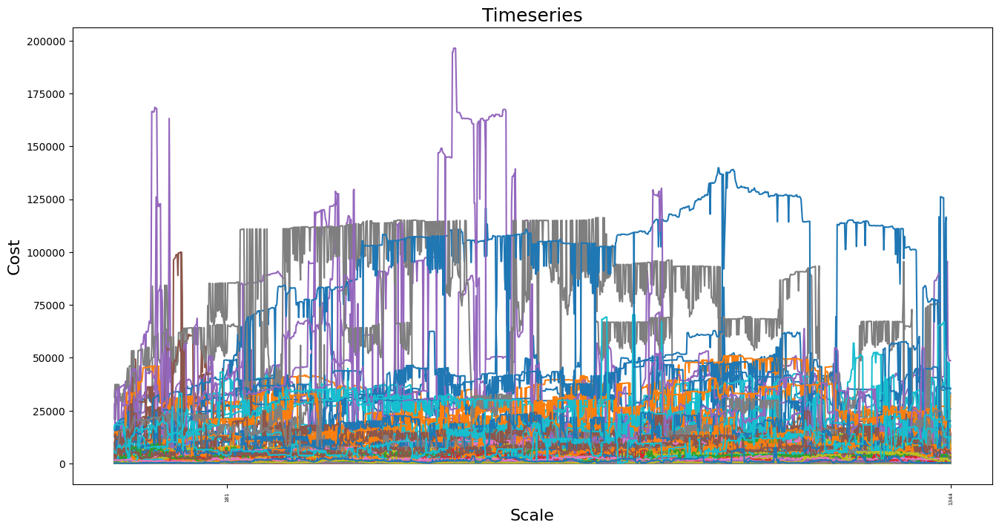

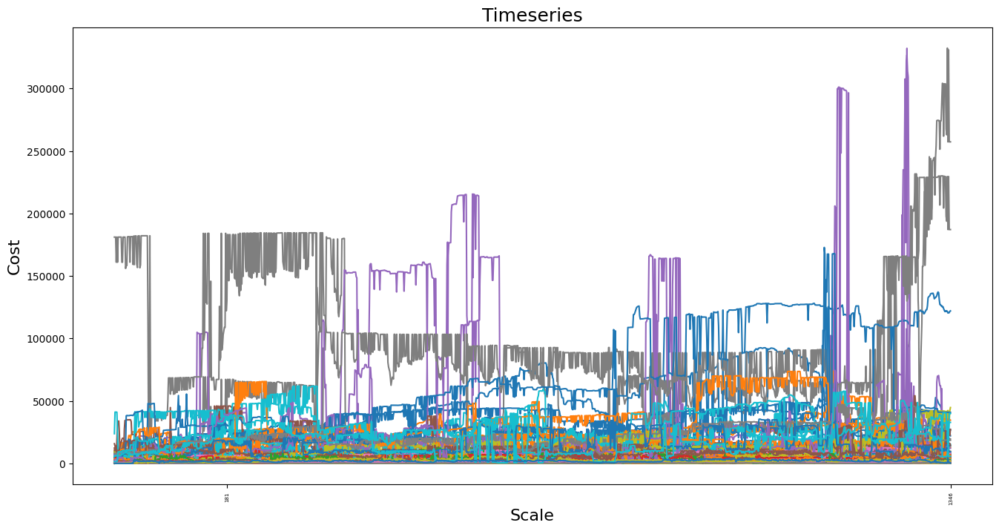

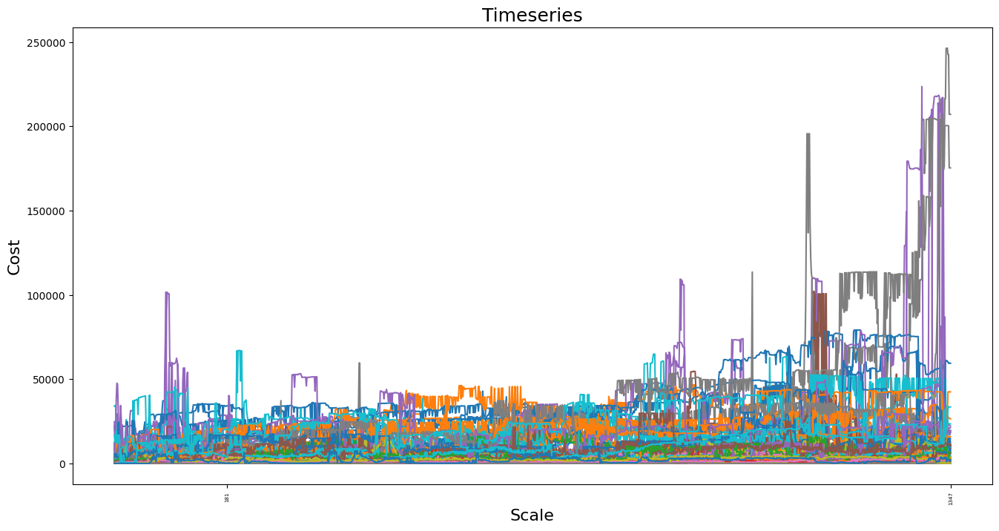

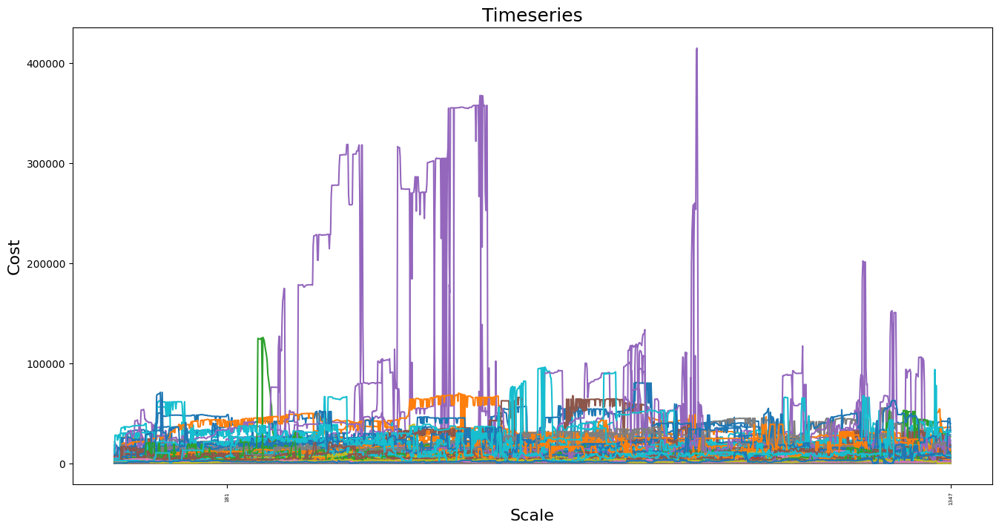

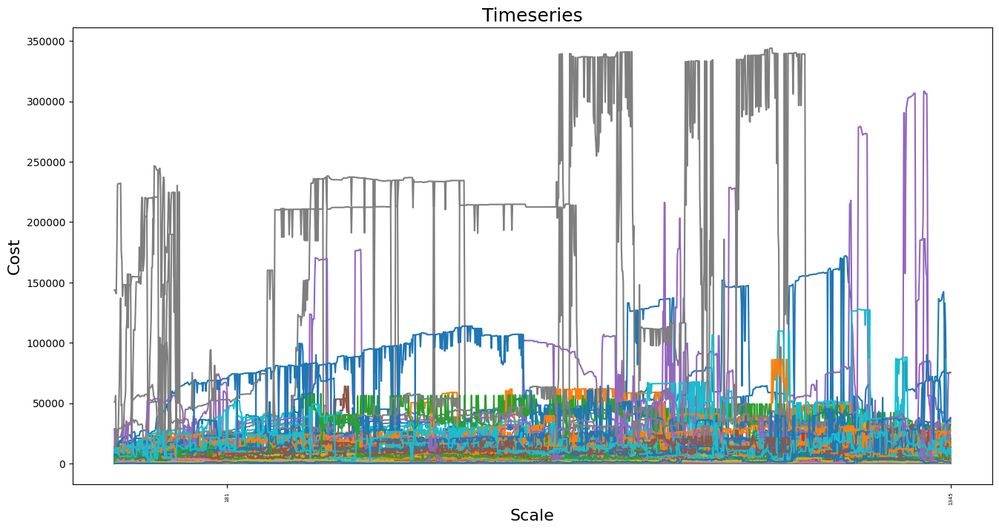

...

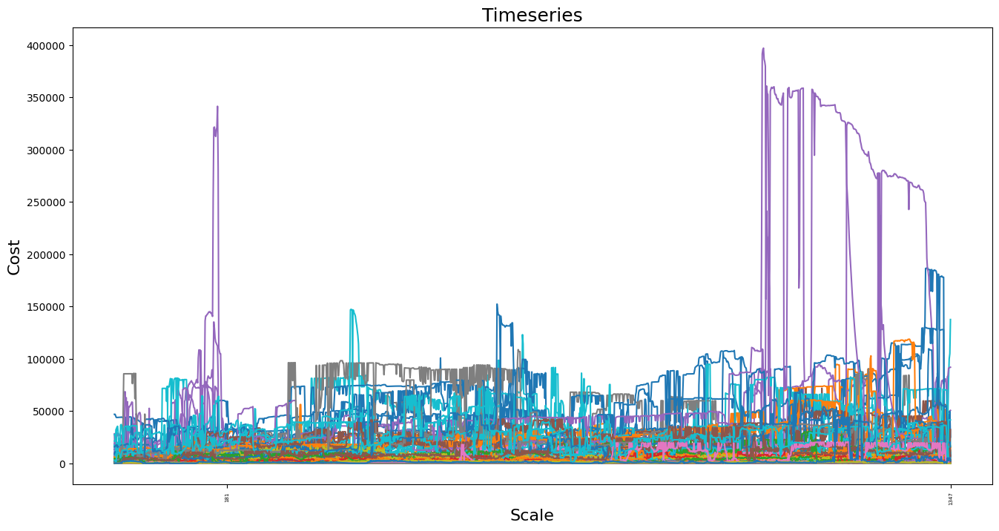

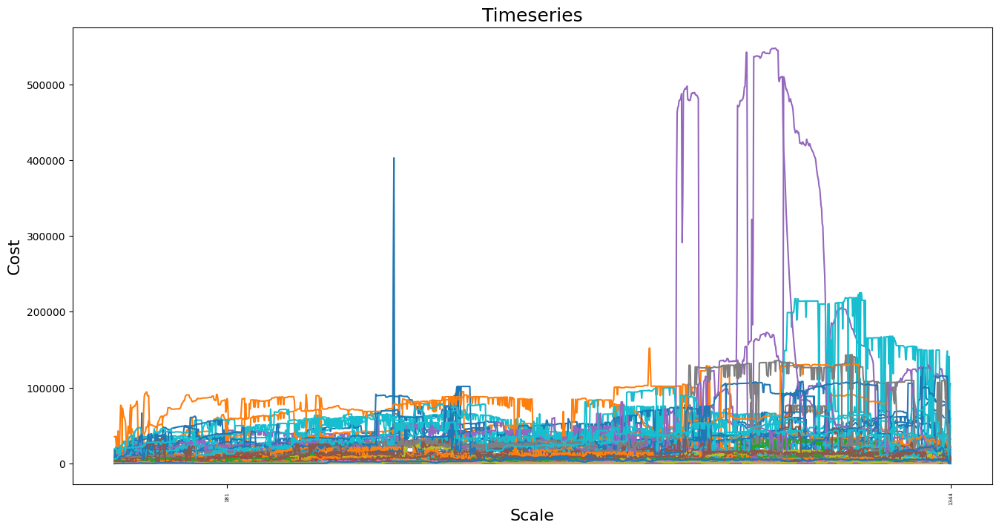

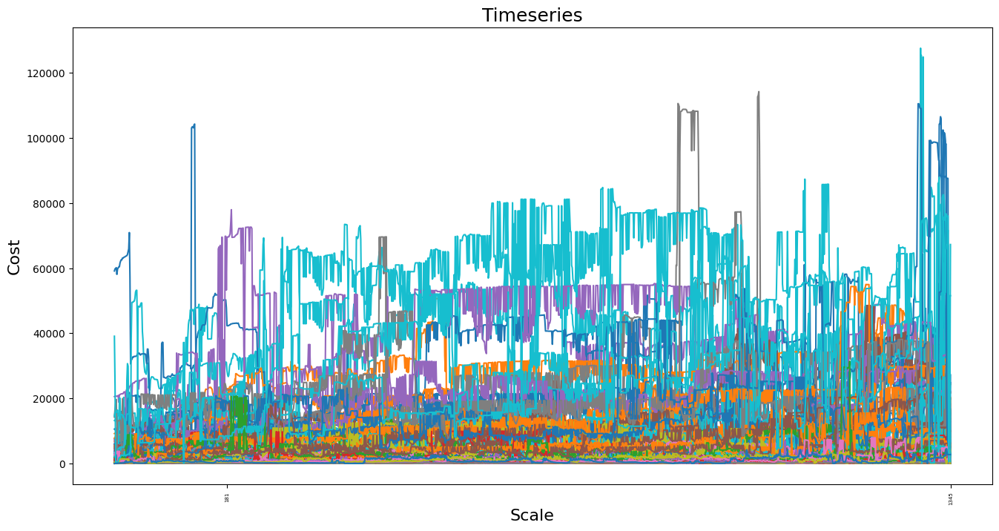

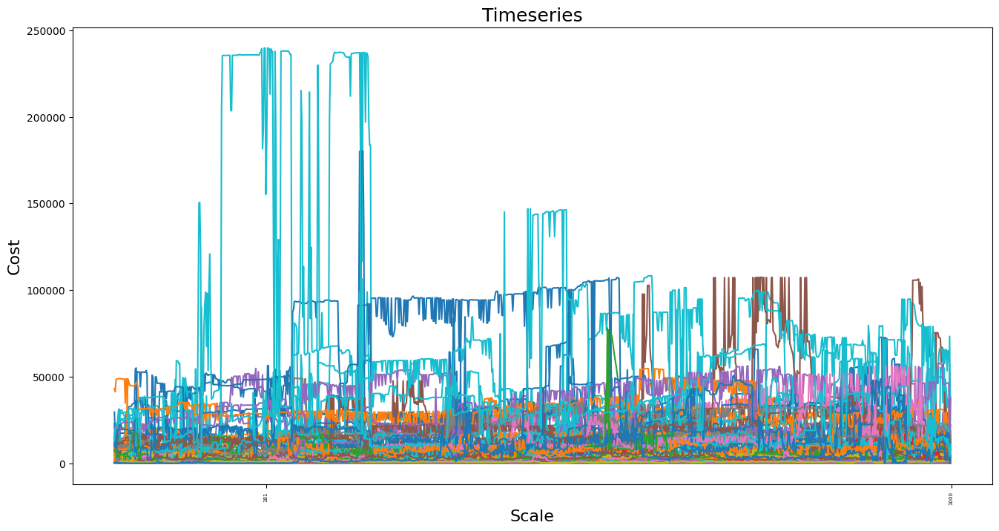

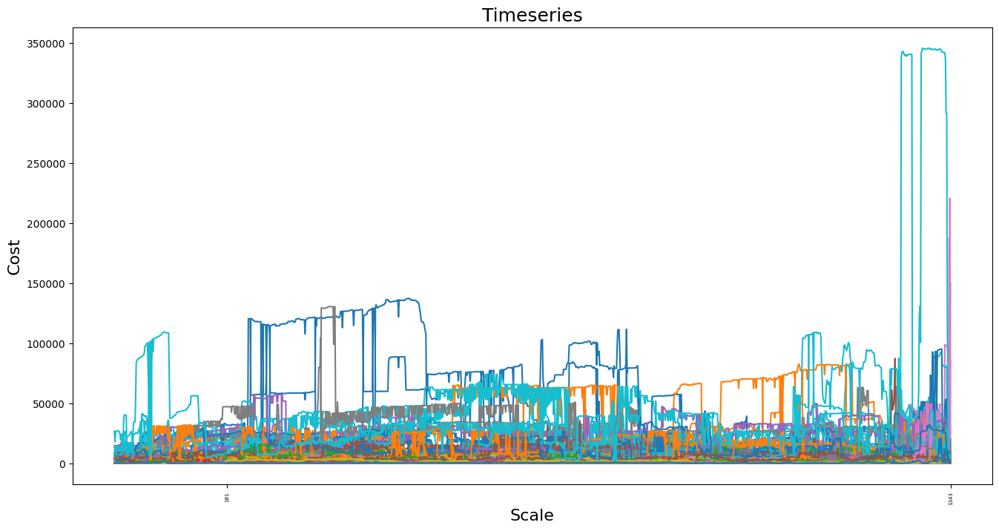

In [ ]:
df = pd.read_pickle(new_pkl_path)
with PdfPages('figures/plot/plot.pdf') as pdf:
    for df_unit in df:
        dims = list(df_unit.columns)
        # Vẽ biểu đồ bboxplot
        plt.figure(figsize=(16, 8))
        for col in dims:
            plt.plot([x for x in range(0, df_unit.shape[0])], df_unit[col])
        plt.xlabel('Scale', fontsize=16)
        plt.ylabel('Cost', fontsize=16)
        plt.xticks(df_unit.shape, rotation=90, fontsize=5)
        plt.title("Timeseries", fontsize=18)
        pdf.savefig()
    plt.close()

# PCA

In [ ]:
df = pd.read_pickle(new_pkl_path)
df_standard_scaler = []
for df_unit in df:
    df_tranform = pd.DataFrame(data = StandardScaler().fit_transform(df_unit.loc[:, feature_remove_target].values),\
        columns = feature_remove_target)
    df_standard_scaler.append(df_tranform)

In [ ]:
temp_df_standard_scaler = df_standard_scaler[0]
pca_dataframe_company = pd.DataFrame()
pca = PCA(n_components = 1)
for company in company_list:
    dataframe_company = pd.DataFrame()
    for feature in action_features_list:
        dataframe_company= pd.concat([dataframe_company, temp_df_standard_scaler.loc[:, ''.join([feature, company])]], axis = 1)
    component = pd.DataFrame(pca.fit_transform(dataframe_company.values), columns = [company])
    pca_dataframe_company = pd.concat([pca_dataframe_company, component], axis = 1)
print(pca_dataframe_company)

           ACB       BCM       BID       BVH       CTG       FPT       GAS  \
0     3.674689 -1.420921 -3.558526 -2.043473 -2.472939 -3.671157 -1.925112   
1     3.740848 -1.420921 -3.419468 -2.040640 -2.338615 -3.339909 -2.017512   
2     3.705669 -1.420921 -3.558526 -2.043473 -2.321395 -3.488272 -1.973730   
3     3.628643 -1.420921 -3.422931 -2.047986 -2.414979 -3.320877 -1.939839   
4     3.671680 -1.142612 -3.558526 -2.051642 -2.430692 -3.531899 -1.951702   
...        ...       ...       ...       ...       ...       ...       ...   
1339 -2.230791  3.043719  1.047709  2.621337  2.714329  4.201748  2.094059   
1340 -1.773187  3.043719  0.370587  2.696283  2.970372  4.166484  1.893035   
1341 -2.193104  4.269607  0.669452  2.598216  2.987136  3.320545  1.835740   
1342 -2.076753  3.043719  0.669452  2.595722  2.980777  3.324940  1.696927   
1343 -2.103054  3.043719  0.357051  2.832825  2.974398  3.309457  1.704707   

           GVR       HDB       HPG  ...       TCB       TPB    

In [ ]:
dataframe_cluster = pd.DataFrame()
for company in company_list:
    temp = pd.DataFrame(data = [[ np.mean(pca_dataframe_company.loc[:,company].values)], \
                            [np.var(pca_dataframe_company.loc[:,company].values)]], \
                            columns = [company], index = ["mean", "variance"])
    dataframe_cluster= pd.concat([dataframe_cluster, temp], axis =1)
print(dataframe_cluster)

                   ACB       BCM           BID       BVH           CTG  \
mean      8.458842e-17  0.000000  8.458842e-17  0.000000  1.691768e-16   
variance  2.142765e+00  2.183611  2.712754e+00  2.250643  3.018098e+00   

                   FPT           GAS           GVR           HDB  \
mean     -8.458842e-17  8.458842e-17  8.458842e-17 -8.458842e-17   
variance  2.459209e+00  2.214248e+00  2.639015e+00  3.361215e+00   

                   HPG  ...           TCB           TPB       VCB       VHM  \
mean      4.229421e-17  ... -8.458842e-17 -8.458842e-17  0.000000  0.000000   
variance  3.336763e+00  ...  2.391063e+00  2.817535e+00  2.588665  2.460362   

               VIB       VIC           VJC           VNM           VPB  \
mean      0.000000  0.000000 -8.458842e-17 -8.458842e-17  8.458842e-17   
variance  3.282189  2.550123  2.520436e+00  3.462010e+00  2.257468e+00   

                   VRE  
mean     -1.691768e-16  
variance  2.979350e+00  

[2 rows x 30 columns]


# Cluster

In [ ]:
def findColumnName(index1, index2, dataframe_in_use, list_data):
    for item in list_data:
        if (dataframe_in_use.at["mean", item] == index1) and (dataframe_in_use.at["variance", item] == index2):
            return item
    return "none"
    

C:\Users\84947\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\84947\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\84947\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\U

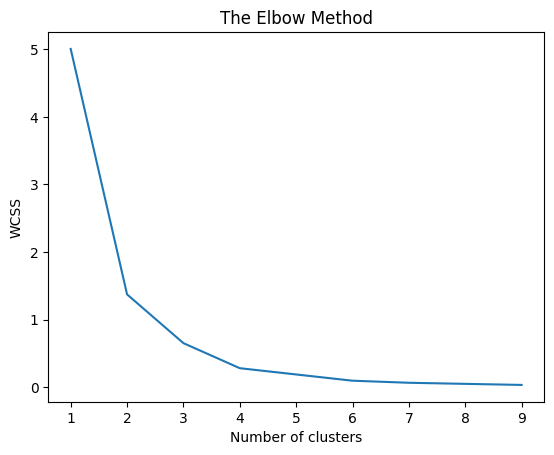

In [ ]:
df_cluster = dataframe_cluster.transpose()
wcss = []
for i in range(1, 10):
    kmeans = KMeans(n_clusters=i)
    clusters = kmeans.fit_predict(df_cluster)
    wcss.append(kmeans.inertia_)

plt.plot(range(1, 10), wcss)
plt.title('The Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()

In [ ]:
kmeans = KMeans(n_clusters=4)
clusters = kmeans.fit_predict(df_cluster)

C:\Users\84947\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


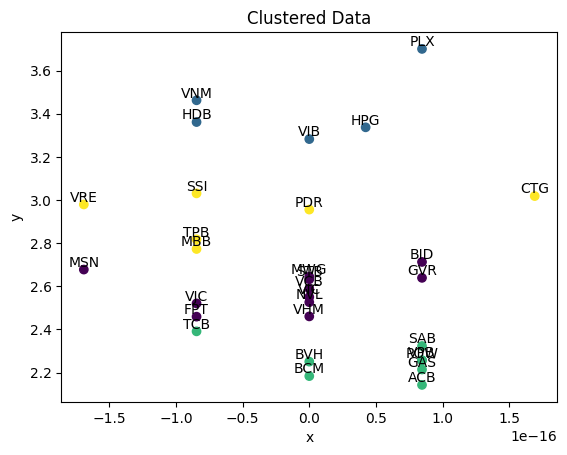

In [ ]:
plt.scatter(df_cluster.loc[:, "mean"], df_cluster.loc[:, "variance"], c=clusters)
for (xi, yi) in zip(df_cluster.loc[:, "mean"].values, df_cluster.loc[:, "variance"].values):
    text_temp = findColumnName(xi, yi, dataframe_cluster, company_list)
    plt.text(xi, yi, text_temp, va='bottom', ha='center')
plt.title('Clustered Data')
plt.xlabel('x')
plt.ylabel('y')
plt.show()


## PCA df[1]

In [ ]:
temp_df_standard_scaler_1 = df_standard_scaler[1]
pca_dataframe_company_1 = pd.DataFrame()
pca_1 = PCA(n_components = 1)
for company in company_list:
    dataframe_company_1 = pd.DataFrame()
    for feature in action_features_list:
        dataframe_company_1= pd.concat([dataframe_company_1, temp_df_standard_scaler_1.loc[:, ''.join([feature, company])]], axis = 1)
    component = pd.DataFrame(pca_1.fit_transform(dataframe_company_1.values), columns = [company])
    pca_dataframe_company_1 = pd.concat([pca_dataframe_company_1, component], axis = 1)
print(pca_dataframe_company_1)

           ACB       BCM       BID       BVH       CTG       FPT       GAS  \
0     5.096422 -1.384733  3.471096  6.144321 -2.569054 -0.829569  2.627696   
1     5.155553 -1.235944  3.464672  4.894755 -3.216700 -1.193956  2.577737   
2     5.163253 -1.355324  3.471096  4.685120 -2.885883 -1.678423  2.577737   
3     5.155553 -1.541409  3.471096  4.973189 -3.373379 -1.683967  2.651047   
4     5.155553 -1.541409  3.471096  4.419322 -3.216700 -1.648518  2.626068   
...        ...       ...       ...       ...       ...       ...       ...   
1341 -3.719155 -1.483925  1.650603 -4.079376  0.206371  0.893000 -2.116198   
1342 -0.434142 -2.761657  1.448413 -3.914493  0.166837  1.187481 -2.127073   
1343 -0.692154 -1.955783  1.650603 -3.914493  0.396844  0.905590 -2.141639   
1344 -1.611753 -1.932687  1.650603 -3.838145  0.412808  1.216810 -2.188589   
1345 -1.535021 -1.636658  1.650603 -2.727578  0.168324  0.914290 -2.148315   

           GVR       HDB       HPG  ...       TCB       TPB    

In [ ]:
dataframe_cluster_1 = pd.DataFrame()
for company in company_list:
    temp_1 = pd.DataFrame(data = [[ np.mean(pca_dataframe_company_1.loc[:,company].values)], \
                            [np.var(pca_dataframe_company_1.loc[:,company].values)]], \
                            columns = [company], index = ["mean", "variance"])
    dataframe_cluster_1= pd.concat([dataframe_cluster_1, temp_1], axis =1)
print(dataframe_cluster_1)

               ACB           BCM           BID           BVH           CTG  \
mean      0.000000 -1.055784e-16  8.446273e-17  8.446273e-17 -8.446273e-17   
variance  2.480747  2.409383e+00  3.357113e+00  2.231650e+00  2.910600e+00   

                   FPT       GAS           GVR           HDB       HPG  ...  \
mean      8.446273e-17  0.000000 -2.111568e-17  1.266941e-16  0.000000  ...   
variance  2.575736e+00  2.253481  2.279777e+00  2.382495e+00  3.080188  ...   

               TCB       TPB           VCB           VHM           VIB  \
mean      0.000000  0.000000 -8.446273e-17  4.751029e-17 -1.689255e-16   
variance  2.762187  2.435183  3.006076e+00  1.666259e+00  3.375536e+00   

               VIC           VJC           VNM           VPB           VRE  
mean      0.000000  4.223137e-17  8.446273e-17 -4.223137e-17  1.055784e-17  
variance  2.710756  1.914857e+00  3.347366e+00  2.219089e+00  2.536252e+00  

[2 rows x 30 columns]


In [ ]:
def findColumnName(index1, index2, dataframe_in_use, list_data):
    for item in list_data:
        if (dataframe_in_use.at["mean", item] == index1) and (dataframe_in_use.at["variance", item] == index2):
            return item
    return "none"

C:\Users\84947\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\84947\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\84947\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\U

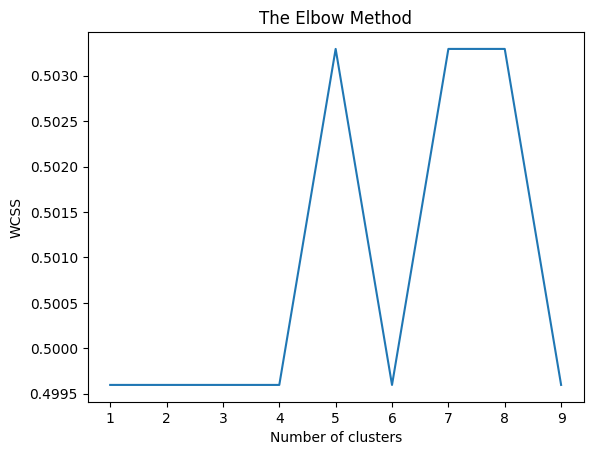

In [ ]:
df_cluster_1 = dataframe_cluster_1.transpose()
wcss_1 = []
for i in range(1, 10):
    kmeans_1 = KMeans(n_clusters=i)
    clusters_1 = kmeans.fit_predict(df_cluster_1)
    wcss_1.append(kmeans.inertia_)

plt.plot(range(1, 10), wcss_1)
plt.title('The Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()

In [ ]:
kmeans_1 = KMeans(n_clusters=4)
clusters_1 = kmeans.fit_predict(df_cluster_1)

C:\Users\84947\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


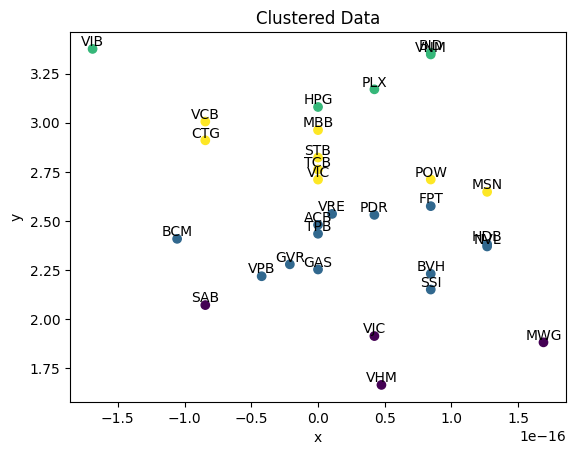

In [ ]:
plt.scatter(df_cluster_1.loc[:, "mean"], df_cluster_1.loc[:, "variance"], c=clusters_1)
for (xi, yi) in zip(df_cluster_1.loc[:, "mean"].values, df_cluster_1.loc[:, "variance"].values):
    text_temp = findColumnName(xi, yi, dataframe_cluster_1, company_list)
    plt.text(xi, yi, text_temp, va='bottom', ha='center')
plt.title('Clustered Data')
plt.xlabel('x')
plt.ylabel('y')
plt.show()

## PCA 23D

In [ ]:
df = pd.read_pickle(new_pkl_path)
df_standard_scaler = []
for df_unit in df:
    df_tranform = pd.DataFrame(data = StandardScaler().fit_transform(df_unit.loc[:, feature_remove_target].values),\
        columns = feature_remove_target)
    df_standard_scaler.append(df_tranform)

In [ ]:
scale_data_23d = pd.DataFrame()
for item in df_standard_scaler:
    scale_data_23d= pd.concat([scale_data_23d, item], ignore_index = True)

pca_dataframe_company_23d = pd.DataFrame()
pca_23d = PCA(n_components = 1)
for company in company_list:
    dataframe_company_23d = pd.DataFrame()
    for feature in action_features_list:
        dataframe_company_23d= pd.concat([dataframe_company_23d, scale_data_23d.loc[:, ''.join([feature, company])]], axis = 1)
    component_23d = pd.DataFrame(pca.fit_transform(dataframe_company_23d.values), columns = [company])
    pca_dataframe_company_23d = pd.concat([pca_dataframe_company_23d, component_23d], axis = 1)
print(pca_dataframe_company_23d)

            ACB       BCM       BID       BVH        CTG       FPT       GAS  \
0     -2.603866 -1.216735 -3.512226 -2.052905  -1.578983 -2.902974 -2.208083   
1     -2.529390 -1.216735 -3.479711 -1.890728  -1.490212 -3.070599 -2.284678   
2     -2.555791 -1.216735 -3.512226 -2.052905  -1.437566 -3.001825 -2.254028   
3     -2.638475 -1.216735 -3.536801 -1.896177  -1.518814 -3.108969 -2.212234   
4     -2.595922 -1.243153 -3.512226 -2.145711  -1.535364 -2.783205 -2.135226   
...         ...       ...       ...       ...        ...       ...       ...   
30533  0.769663  0.605298  0.803574  3.226139   0.732561  3.053018 -0.253352   
30534  2.080222  0.605298  0.915740  3.226139   1.118579  3.841495  0.744390   
30535  1.529559  0.666950  1.049337  3.226139   9.009737  2.510949  0.218042   
30536  1.529559  0.678742  0.915740  3.226139  11.639573  2.510949  0.218042   
30537  0.905315  0.682402  1.346969  3.226139  11.639573  2.986411  0.218042   

             GVR        HDB        HPG 

In [ ]:
dataframe_cluster_23d = pd.DataFrame()
for company in company_list:
    temp_23d = pd.DataFrame(data = [[ np.mean(pca_dataframe_company_23d.loc[:,company].values)], \
                            [np.var(pca_dataframe_company_23d.loc[:,company].values)]], \
                            columns = [company], index = ["mean", "variance"])
    dataframe_cluster_23d= pd.concat([dataframe_cluster_23d, temp_23d], axis =1)
print(dataframe_cluster_23d)

                   ACB           BCM           BID           BVH  \
mean      3.722799e-17 -1.861400e-18  2.047539e-17 -1.489120e-17   
variance  2.073835e+00  1.900071e+00  2.112825e+00  1.862018e+00   

                   CTG           FPT           GAS           GVR  \
mean      3.350519e-17 -9.306998e-18 -4.095079e-17  2.605959e-17   
variance  2.195006e+00  2.170452e+00  2.286930e+00  2.175419e+00   

                   HDB           HPG  ...           TCB           TPB  \
mean     -3.722799e-18  1.675260e-17  ...  2.605959e-17  1.675260e-17   
variance  2.074875e+00  2.317501e+00  ...  1.984960e+00  2.121434e+00   

                   VCB           VHM           VIB           VIC  \
mean     -7.073318e-17  7.445598e-18 -7.445598e-18 -3.722799e-18   
variance  2.036255e+00  1.968026e+00  2.074594e+00  2.110829e+00   

                   VJC           VNM           VPB           VRE  
mean     -2.233679e-17  2.792099e-18  2.047539e-17 -3.536659e-17  
variance  1.875689e+00  2.19383

In [ ]:
def findColumnName(index1, index2, dataframe_in_use, list_data):
    for item in list_data:
        if (dataframe_in_use.at["mean", item] == index1) and (dataframe_in_use.at["variance", item] == index2):
            return item
    return "none"
    

C:\Users\84947\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\84947\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\Users\84947\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
C:\U

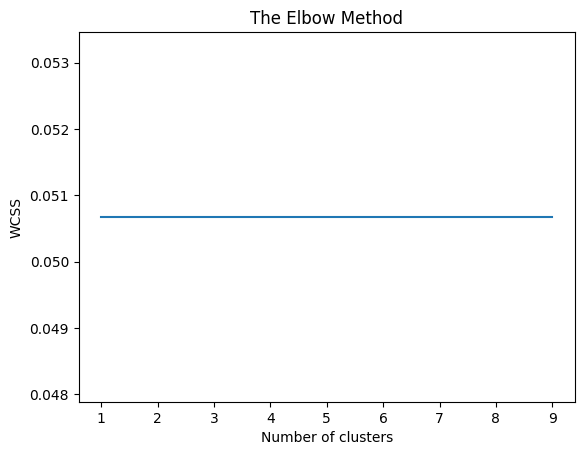

In [ ]:
df_cluster_23d = dataframe_cluster_23d.transpose()
wcss_23d = []
for i in range(1, 10):
    kmeans_23d = KMeans(n_clusters=i)
    clusters_23d = kmeans.fit_predict(df_cluster_23d)
    wcss_23d.append(kmeans.inertia_)

plt.plot(range(1, 10), wcss_23d)
plt.title('The Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()

In [ ]:
kmeans_23d = KMeans(n_clusters=4)
clusters_23d = kmeans.fit_predict(df_cluster_23d)

C:\Users\84947\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


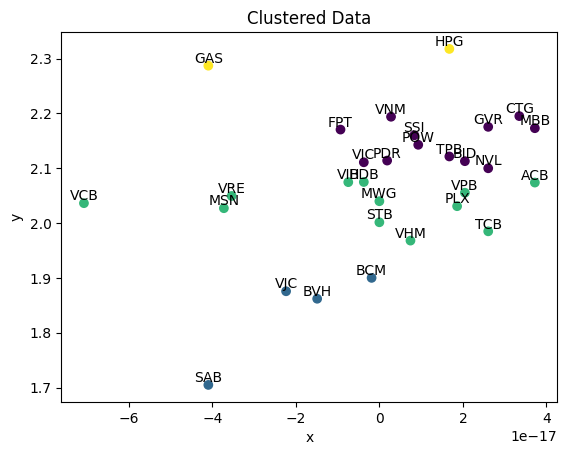

In [ ]:
plt.scatter(df_cluster_23d.loc[:, "mean"], df_cluster_23d.loc[:, "variance"], c=clusters_23d)
for (xi, yi) in zip(df_cluster_23d.loc[:, "mean"].values, df_cluster_23d.loc[:, "variance"].values):
    text_temp = findColumnName(xi, yi, dataframe_cluster_23d, company_list)
    plt.text(xi, yi, text_temp, va='bottom', ha='center')
plt.title('Clustered Data')
plt.xlabel('x')
plt.ylabel('y')
plt.show()


Phân tích khi phân cụm trên mẫu 1 df và trên tổng thể 23 df ta có thể thấy, một số đặc điểm của các nhóm:
- SAB, VIC luôn thuộc nhóm dữ liệu ít biến động, có tính ổn định cao
- HBG thuộc nhóm có biến động chung về giá và mua bán lớn nhất
- VCB có ít tầm ảnh hưởng do có ảnh hưởng khối lượng và giá trung bình không lớn


# RNN - Attributes Time Series Forecasting


## `1.`Library

In [ ]:
import IPython
import IPython.display
import matplotlib as mpl
import seaborn as sns
import tensorflow as tf

from numpy import array
from numpy import hstack
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM
from keras.layers import RNN, SimpleRNN
from keras.preprocessing.sequence import TimeseriesGenerator
from keras.layers import Dropout
from keras.optimizers import Adam
from keras.callbacks import LambdaCallback
from sklearn.preprocessing import MinMaxScaler
mpl.rcParams['figure.figsize'] = (8, 6)
mpl.rcParams['axes.grid'] = False

## `2.` Data prepare & split

In [ ]:
df_list = pd.read_pickle(new_pkl_path)
df_unpca = pd.DataFrame()
for df_unit in df_list:
    df_unpca = pd.concat([df_unpca, df_unit], axis = 0)
df_target =df_unpca['Gia KL']
pca_dataframe_company = pd.DataFrame()
pca = PCA(n_components = 1)
for company in company_list:
    dataframe_company = pd.DataFrame()
    for feature in action_features_list:
        dataframe_company= pd.concat([dataframe_company, df_unpca.loc[:, ''.join([feature, company])]], axis = 1)
    component = pd.DataFrame(pca.fit_transform(dataframe_company.values), columns = [company])
    pca_dataframe_company = pd.concat([pca_dataframe_company, component], axis = 1)
df = pca_dataframe_company

In [ ]:
scaler = MinMaxScaler(feature_range=(0, 1))
scaled = scaler.fit_transform(array(df_target).reshape(len(df_target), 1))
series = pd.DataFrame(scaled)
series.columns = ['target']
print(series)

         target
0      0.685832
1      0.686972
2      0.686858
3      0.686223
4      0.685832
...         ...
30533  0.129135
30534  0.125029
30535  0.125941
30536  0.125257
30537  0.125029

[30538 rows x 1 columns]


In [ ]:
n = len(df)
train_df = df[0:int(n*0.7)]
val_df = df[int(n*0.7):int(n*0.9)]
test_df = df[int(n*0.9):]

target_train_df = series[0:int(n*0.7)]
target_val_df = series[int(n*0.7):int(n*0.9)]
target_test_df = series[int(n*0.9):]
print(train_df.shape[0], val_df.shape[0], test_df.shape[0] )
print(target_train_df.shape[0], target_val_df.shape[0], target_test_df.shape[0] )


21376 6108 3054
21376 6108 3054


In [ ]:
train_mean = train_df.mean()
train_std = train_df.std()

train_df = (train_df - train_mean) / train_std
val_df = (val_df - train_mean) / train_std
test_df = (test_df - train_mean) / train_std

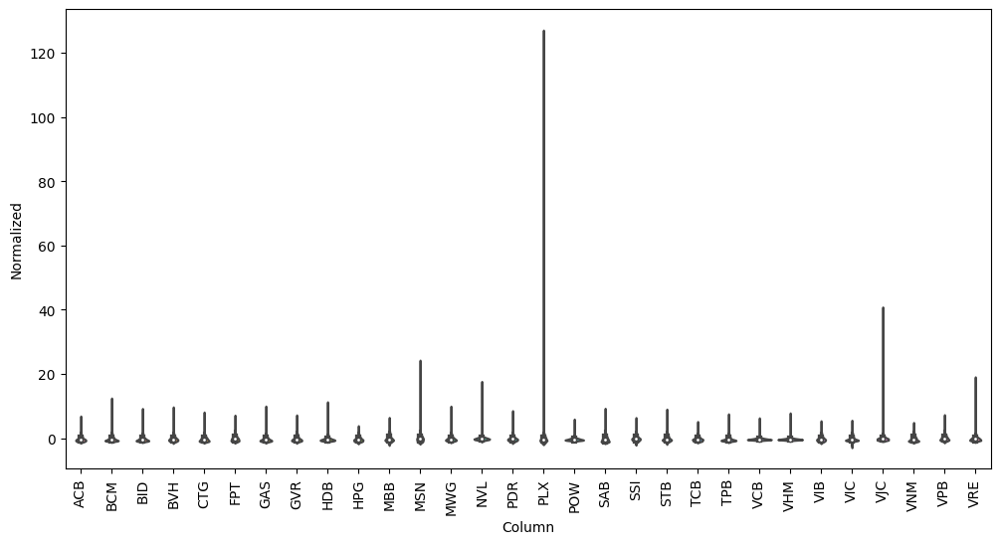

In [ ]:
df_std = (df - train_mean) / train_std
df_std = df_std.melt(var_name='Column', value_name='Normalized')
plt.figure(figsize=(12, 6))
ax = sns.violinplot(x='Column', y='Normalized', data=df_std)
_ = ax.set_xticklabels(df.keys(), rotation=90)

In [ ]:
data_train = []
for item in company_list:
    item = np.array(train_df[item]).reshape((train_df[item].shape[0],1))
    data_train.append(item)
train_target = np.array(target_train_df).reshape((target_train_df.shape[0],1))
data_train.append(np.array(target_train_df).reshape((target_train_df.shape[0],1)))
print(data_train)
datatrain_feed = hstack(data_train)


[array([[-1.14761383],
       [-1.13467583],
       [-1.1323797 ],
       ...,
       [ 0.50030674],
       [ 0.49715114],
       [ 0.81290303]]), array([[-1.00326943],
       [-1.00326943],
       [-1.00326943],
       ...,
       [ 1.98668485],
       [ 1.89852716],
       [ 2.65377631]]), array([[-1.0057171 ],
       [-0.87917726],
       [-1.0057171 ],
       ...,
       [-1.04268419],
       [-1.04210757],
       [-1.03502695]]), array([[-1.16395726],
       [-0.926192  ],
       [-1.16395726],
       ...,
       [-0.10635363],
       [-0.42049572],
       [ 0.24426622]]), array([[-0.47102594],
       [-0.33608435],
       [-0.31962528],
       ...,
       [ 0.40095795],
       [ 0.44367184],
       [ 0.39269574]]), array([[ 0.05748839],
       [ 0.09021164],
       [ 0.07499056],
       ...,
       [-0.54530147],
       [-0.60090249],
       [-0.61261378]]), array([[-0.94165426],
       [-1.0450229 ],
       [-0.98928715],
       ...,
       [-0.78526974],
       [-0.49973511],
 

In [ ]:
data_val = []
for item in company_list:
    item = np.array(val_df[item]).reshape((val_df[item].shape[0],1))
    data_val.append(item)
val_target = np.array(target_val_df).reshape((target_val_df.shape[0],1))
data_val.append(np.array(target_val_df).reshape((target_val_df.shape[0],1)))
print(data_val)
dataval_feed = hstack(data_val)


[array([[ 0.78781388],
       [ 0.78187555],
       [ 0.78768866],
       ...,
       [ 0.21432974],
       [-0.29539412],
       [-0.29193902]]), array([[ 2.57048525],
       [ 2.73672758],
       [ 2.05938919],
       ...,
       [-0.53110902],
       [-0.55340798],
       [-0.79998332]]), array([[-0.99816034],
       [-1.03121349],
       [-1.0052113 ],
       ...,
       [-0.9704526 ],
       [-1.05667216],
       [-1.05575103]]), array([[-0.15240051],
       [-0.04580128],
       [ 0.51182764],
       ...,
       [-0.24174775],
       [-0.73791257],
       [-0.71609512]]), array([[ 0.25679701],
       [ 0.41374873],
       [ 0.58488139],
       ...,
       [-0.57147374],
       [-0.42560068],
       [-0.53947472]]), array([[-0.17087422],
       [-0.5564497 ],
       [-0.5586128 ],
       ...,
       [-0.05802401],
       [ 0.50710837],
       [-0.11742955]]), array([[-0.82360155],
       [-0.82614   ],
       [-0.83696014],
       ...,
       [-1.07024464],
       [-1.07290216],
 

In [ ]:
data_test = []
for item in company_list:
    item = np.array(test_df[item]).reshape((test_df[item].shape[0],1))
    data_test.append(item)
test_target = np.array(target_test_df).reshape((target_test_df.shape[0],1))
data_test.append(np.array(target_test_df).reshape((target_test_df.shape[0],1)))
print(data_test)
datatest_feed = hstack(data_test)

[array([[-0.29247243],
       [-0.29012289],
       [-0.37439981],
       ...,
       [ 1.72189917],
       [ 1.72189917],
       [ 3.14357846]]), array([[-0.5713379 ],
       [-0.63687531],
       [-0.6536555 ],
       ...,
       [-0.29429468],
       [-0.21774727],
       [-0.19399117]]), array([[-1.02317638],
       [-1.01805416],
       [-1.04503391],
       ...,
       [-1.0053582 ],
       [-0.92102407],
       [-0.83956288]]), array([[-0.69098949],
       [-0.27124651],
       [-0.27759698],
       ...,
       [-0.36116425],
       [-0.36116425],
       [-0.36116425]]), array([[-0.42541863],
       [-0.55882635],
       [-0.45194152],
       ...,
       [-0.22572934],
       [-0.84300825],
       [-0.84300825]]), array([[-0.15439942],
       [-0.18750984],
       [-0.21417094],
       ...,
       [-0.04348283],
       [-0.04348283],
       [ 2.13860814]]), array([[-0.80268743],
       [-1.06738669],
       [-1.0676375 ],
       ...,
       [-0.37241111],
       [-0.37241111],
 

In [ ]:
n_features = datatrain_feed.shape[1]
n_input = len(company_list)
generator_train = TimeseriesGenerator(datatrain_feed, train_target, length=n_input, batch_size=len(datatrain_feed))

In [ ]:
generator_test = TimeseriesGenerator(datatest_feed, test_target, length=n_input, batch_size=1)


In [ ]:
generator_hold = TimeseriesGenerator(dataval_feed, val_target, length=n_input, batch_size=1)

In [ ]:
model = Sequential()

model.add(SimpleRNN(4, activation='relu', input_shape=(n_input, n_features), return_sequences = False))
model.add(Dense(1, activation='relu'))

adam = Adam(lr=0.0001)
model.compile(optimizer=adam, loss='mse')

In [ ]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 simple_rnn_1 (SimpleRNN)    (None, 4)                 144       
                                                                 
 dense_1 (Dense)             (None, 1)                 5         
                                                                 
Total params: 149 (596.00 Byte)
Trainable params: 149 (596.00 Byte)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


## `3.` Training Model
Các thông số: CPU: M1 Apple Silicion

In [91]:
score = model.fit_generator(generator_train, epochs=1000, verbose=0, validation_data=generator_test)

/var/folders/_x/886sy6k57y90dfy4fjklx08r0000gn/T/ipykernel_7220/3643625751.py:1: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  score = model.fit_generator(generator_train, epochs=50, verbose=0, validation_data=generator_test)
2023-05-13 17:30:14.220361: I tensorflow/core/common_runtime/executor.cc:1210] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype int32
	 [[{{node Placeholder/_0}}]]
2023-05-13 17:30:14.940070: I tensorflow/core/common_runtime/executor.cc:1210] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype int32
	 [[{{node Placeholder/_0}}]]


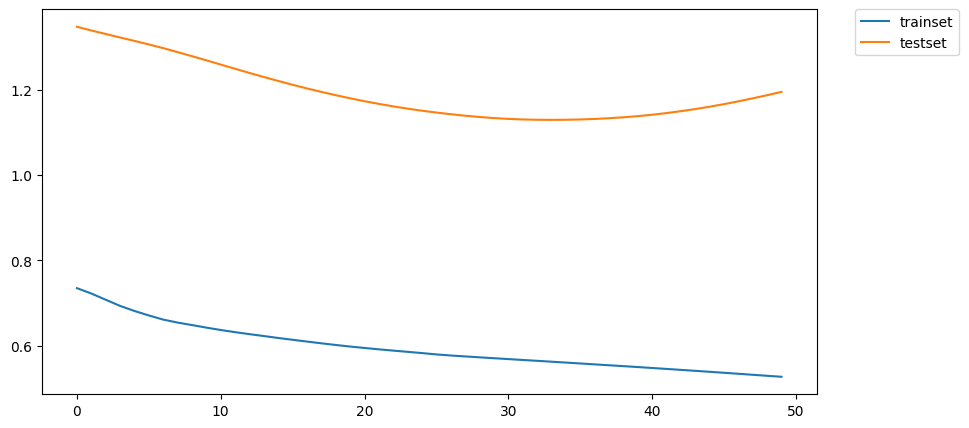

In [92]:
losses = score.history['loss']
val_losses = score.history['val_loss']
plt.figure(figsize=(10,5))
plt.plot(losses, label="trainset")
plt.plot(val_losses, label="testset")
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.show()

## `3.` Predict

In [ ]:
df_result = pd.DataFrame({'Actual' : [], 'Prediction' : []})

for i in range(len(generator_test)):
    x, y = generator_test[i]
    x_input = array(x).reshape((1, n_input, n_features))
    yhat = model.predict(x_input, verbose=2)
    df_result = df_result.append({'Actual': scaler.inverse_transform(y)[0][0], 'Prediction': scaler.inverse_transform(yhat)[0][0]}, ignore_index=True)

In [94]:
df_result['Diff'] = 100 * (df_result['Prediction'] - df_result['Actual']) / df_result['Actual']
print(df_result)

           Actual   Prediction      Diff
0     1038.650000  1013.299988 -2.440669
1     1038.700000  1013.299988 -2.445366
2     1038.600000  1013.299988 -2.435973
3     1038.500000  1013.299988 -2.426578
4     1038.500000  1013.299988 -2.426578
...           ...          ...       ...
3019  1022.733333  1094.644409  7.031264
3020  1022.433333  1059.156982  3.591789
3021  1022.500000  1112.781006  8.829438
3022  1022.450000  1013.299988 -0.894910
3023  1022.433333  1013.299988 -0.893295

[3024 rows x 3 columns]


In [95]:
mean = df_result['Actual'].mean()
mae = (df_result['Actual'] - df_result['Prediction']).abs().mean()

print("mean: ", mean)
print("mae:", mae)
print("mae/mean ratio: ", 100*mae/mean,"%")
print("correctness: ", 100 - 100*mae/mean,"%")

mean:  1027.0927466773746
mae: 55.40976469520958
mae/mean ratio:  5.394816083986486 %
correctness:  94.60518391601352 %


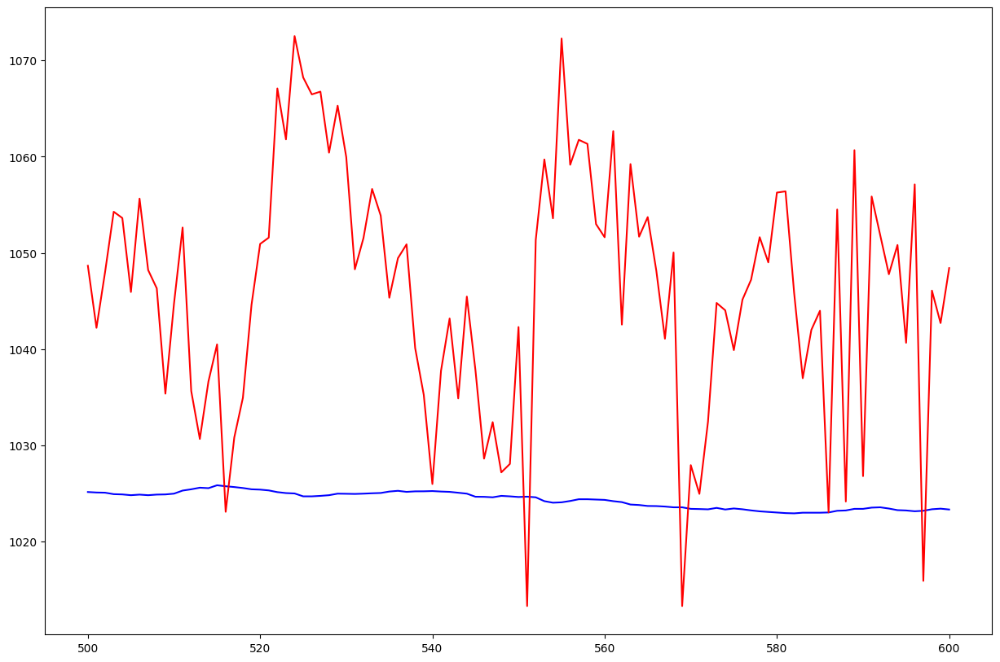

In [104]:
plt.figure(figsize=(15,10))
plt.plot(df_result.loc[500:600,'Actual'], color='blue', label = "Actual")
plt.plot(df_result.loc[500:600,'Prediction'], color='red', label = "Predict")
plt.show()